In [3]:
import matplotlib.pyplot as plt
import seaborn as sns

import keras
from keras.models import Sequential
from keras.layers import Dense, Conv2D , MaxPool2D , Flatten , Dropout 
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam

from sklearn.metrics import classification_report,confusion_matrix

import tensorflow as tf

import cv2
import os

import numpy as np
import random
import matplotlib.image as mpimg
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from keras.optimizers import Adam
import image
import librosa 
import matplotlib.pyplot as plt
import os
import IPython.display as ipd

In [4]:
os.chdir(r"C:\Users\varadraj y\Desktop\test_songs")
os.getcwd () 
cmap = plt.get_cmap('inferno')
filename = "1970's_test.wav"
y, sr = librosa.load(filename, mono=True, duration=30)
ipd.Audio(filename)

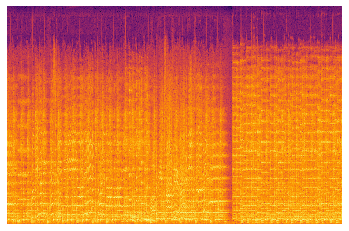

In [5]:
plt.specgram(y, NFFT=2048, Fs=2, Fc=0, noverlap=128, cmap=cmap, sides='default', mode='default', scale='dB');
plt.axis('off');
plt.savefig(f'C:/Users/varadraj y/Desktop/test/{filename[:].replace(".", "")}.png')

In [6]:
from tensorflow import keras
model = keras.models.load_model(r'C:\Users\varadraj y\Desktop\dsp_data\saved_model')

In [7]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 359, 359, 32)      896       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 179, 179, 64)      18496     
_________________________________________________________________
flatten (Flatten)            (None, 2050624)           0         
_________________________________________________________________
dense (Dense)                (None, 100)               205062500 
_________________________________________________________________
dense_1 (Dense)              (None, 5)                 505       
Total params: 205,082,397
Trainable params: 205,082,397
Non-trainable params: 0
_________________________________________________________________


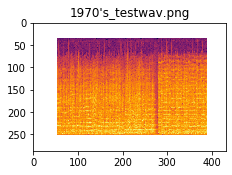

In [8]:
plt.figure(figsize=(20,20))
test_folder=r'C:\Users\varadraj y\Desktop\test'
for i in range(1):
    file =random.choice(os.listdir(test_folder))
    image_path= os.path.join(test_folder, file)
    img=mpimg.imread(image_path)
    ax=plt.subplot(1,5,i+1)
    ax.title.set_text(file)
    plt.imshow(img)

In [9]:
image= cv2.imread(r"C:\Users\varadraj y\Desktop\test\1970's_testwav.png", cv2.COLOR_BGR2RGB)
image=cv2.resize(image, (720, 720),interpolation = cv2.INTER_AREA)
image=np.array(image)
image = image.astype('float32')
image /= 255

In [10]:
image = image.reshape([1,image.shape[0] ] + list(image.shape[1:]))

In [11]:
z=model.predict(image)

In [12]:
for i in z:
    p=max(i)
    if i[0]==p:
        print("2000s")
    elif i[1]==p:
        print("1960s")
    elif i[2]==p:
        print("1970s")
    elif i[3]==p:
        print("1980s")
    elif i[4]==p:
        print("1990s")

1970s
